In [1]:
import numpy as np
import pandas as pdfig = go.Figure(data=go.Heatmap(
        z=z,
        x=dates,
        y=programmers,
        colorscale='Viridis'))

fig.update_layout(
    title='GitHub commits per day',
    xaxis_nticks=36)

fig.show()
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline

In [2]:
data = pd.read_csv('master.csv')
data.head()

,country,year,sex,age,suicides_no,population,suicides/100k pop,country-year,HDI for year,gdp_for_year ($),gdp_per_capita ($),generation
0,Albania,1987,male,15-24 years,21,312900,6.71,Albania1987,NaN,"2,156,624,900",796,Generation X
1,Albania,1987,male,35-54 years,16,308000,5.19,Albania1987,NaN,"2,156,624,900",796,Silent
2,Albania,1987,female,15-24 years,14,289700,4.83,Albania1987,NaN,"2,156,624,900",796,Generation X
3,Albania,1987,male,75+ years,1,21800,4.59,Albania1987,NaN,"2,156,624,900",796,G.I. Generation
4,Albania,1987,male,25-34 years,9,274300,3.28,Albania1987,NaN,"2,156,624,900",796,Boomers


In [3]:
data.columns

Index(['country', 'year', 'sex', 'age', 'suicides_no', 'population',
       'suicides/100k pop', 'country-year', 'HDI for year',
       ' gdp_for_year ($) ', 'gdp_per_capita ($)', 'generation'],
      dtype='object')

In [56]:
data = data.query('year != 2016')
data.rename(columns={'suicides_no':'total_suicides',
                        'suicides/100k pop':'suicides_per_100k',
                        ' gdp_for_year ($) ':'gdp_for_year',
                        'gdp_per_capita ($)':'gdp_per_capita',
                        'HDI for year': 'HDI_for_year'}, inplace=True)

In [58]:
data.columns

Index(['country', 'year', 'sex', 'age', 'total_suicides', 'population',
       'suicides_per_100k', 'country-year', 'HDI_for_year', 'gdp_for_year',
       'gdp_per_capita', 'generation', 'continent'],
      dtype='object')

In [57]:
# count number of male and female
# 男女性数量
data['sex'].value_counts() 

male      13830
female    13830
Name: sex, dtype: int64

In [5]:
# country 
data['country'].value_counts(normalize=True)


Iceland                   0.013731
Netherlands               0.013731
Austria                   0.013731
Mauritius                 0.013731
Singapore                 0.013372
                            ...   
Bosnia and Herzegovina    0.000863
Dominica                  0.000431
Cabo Verde                0.000431
Macau                     0.000431
Mongolia                  0.000359
Name: country, Length: 101, dtype: float64

In [6]:
# generation 
data['generation'].value_counts(normalize=True)

Generation X       0.230338
Silent             0.228756
Millenials         0.210065
Boomers            0.179367
G.I. Generation    0.098634
Generation Z       0.052840
Name: generation, dtype: float64

In [7]:
data['country'].value_counts()

Iceland                   382
Netherlands               382
Austria                   382
Mauritius                 382
Singapore                 372
                         ... 
Bosnia and Herzegovina     24
Dominica                   12
Cabo Verde                 12
Macau                      12
Mongolia                   10
Name: country, Length: 101, dtype: int64

In [8]:
countryYear = data.groupby(['country-year'])
country_gb =  data.groupby(['country'])
# countryYear.mean()
# countryYear['suicides_no'].sum()
country_gb['suicides_no'].sum()




country
Albania                    1970
Antigua and Barbuda          11
Argentina                 82219
Armenia                    1905
Aruba                       101
                         ...   
United Arab Emirates        622
United Kingdom           136805
United States           1034013
Uruguay                   13138
Uzbekistan                34803
Name: suicides_no, Length: 101, dtype: int64

In [9]:

pd.crosstab(data['generation'], data['sex'], margins=True)

sex,female,male,All
generation,,,
Boomers,2495,2495,4990
G.I. Generation,1372,1372,2744
Generation X,3204,3204,6408
Generation Z,735,735,1470
Millenials,2922,2922,5844
Silent,3182,3182,6364
All,13910,13910,27820


## 每一代的性别的比例

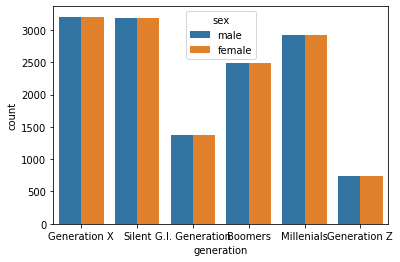

In [10]:
sns.countplot('generation', hue='sex', data=data)

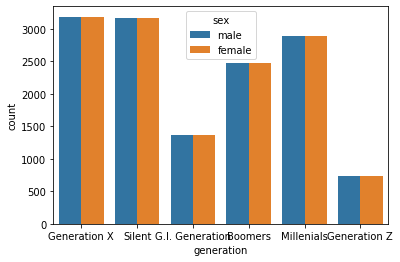

In [55]:
sns.countplot('country', hue='sex', data=data)

In [ ]:
sns.countplot('generation', hue='sex', data=data)

## 不同性别的年龄段的统计

Text(0.5, 1.0, 'Difference gender suicid number, by Age ')

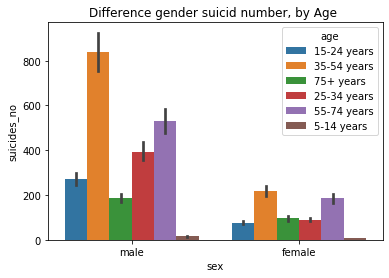

In [11]:
p = sns.barplot(x='sex', y='suicides_no', hue='age', data=data)
plt.title("Difference gender suicid number, by Age ")

In [12]:
count_year = data['year'].value_counts()
count_year

2009    1068
2001    1056
2010    1056
2007    1032
2011    1032
2002    1032
2003    1032
2000    1032
2006    1020
2008    1020
2005    1008
2004    1008
1999     996
2012     972
2013     960
1998     948
2014     936
1995     936
1996     924
1997     924
1994     816
1992     780
1993     780
1990     768
1991     768
2015     744
1987     648
1989     624
1988     588
1986     576
1985     576
2016     160
Name: year, dtype: int64

## 每年的总计数量变化

In [47]:


agg_dict = {'country':'nunique', 'population':'sum', 'total_suicides':'sum'}
yearly_data = data[['year', 'country', 
                       'population',
                       'total_suicides']].groupby('year', as_index=False).agg(agg_dict)
yearly_data.rename(columns={'population':'Population',
                            'total_suicides':'Total Suicides'}, inplace=True)
yearly_data['Suicides by 100k people'] = 100000 * yearly_data['Total Suicides'] / ( yearly_data['Population'] )

yearly_data.head()


,year,country,Population,Total Suicides,Suicides by 100k people
0,1985,48,1008600086,116063,11.507336
1,1986,48,1029909613,120670,11.716562
2,1987,54,1095029726,126842,11.583430
3,1988,49,1054094424,121026,11.481514
4,1989,52,1225514347,160244,13.075653


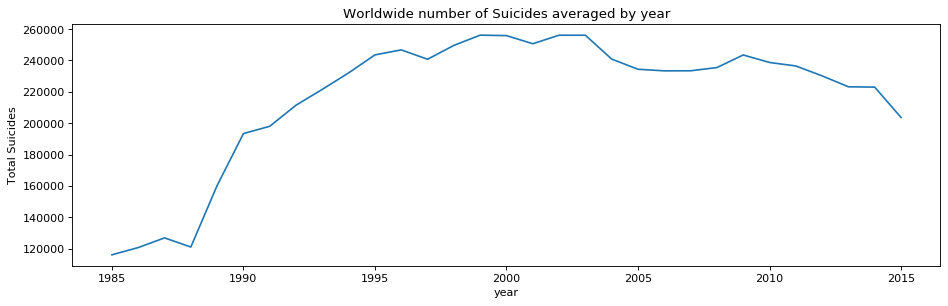

In [14]:
# 每年的数量变化，
# sorry， 我不是要画成这么多颜色 很喜庆的， love & peace
# sns.set(rc={'figure.figsize':(16,12)})
# sns.countplot(x='year', data=data)

fig, ax1 = plt.subplots(1,1,figsize=(14,4), dpi=80, sharey=False)

# sns.lineplot(data=yearly_data, y='Population', x='year', ax=ax1, label='Population')
# ax1.grid(False)
# ax1.legend(bbox_to_anchor=(1, 0.12))
# ax1.set_yticks([1e9, 1.4e9, 1.8e9, 2.2e9, 2.6e9]);
# ax1.set_ylim(1e9, 2.6e9)

# ax2 = plt.twinx()
# sns.lineplot(data=yearly_data, y='Total Suicides', x='year', ax=ax2, color='C3', label='Suicides')
# ax2.grid(False)
# ax2.set_ylim(1e5, 2.6e5)
# ax2.set_yticks([1e5, 1.4e5, 1.8e5, 2.2e5, 2.6e5]);
# ax2.legend(bbox_to_anchor=(1, 0.21))

sns.lineplot(data=yearly_data, y='Total Suicides', x='year')

plt.title('Worldwide number of Suicides averaged by year');

# 测试建立强相互关系图


In [15]:
import plotly.express as px

fig1 = px.line(data, x='age', y='suicides_no', color='sex')
fig1.show()

ValueError: Value of 'y' is not the name of a column in 'data_frame'. Expected one of ['country', 'year', 'sex', 'age', 'total_suicides', 'population', 'suicides_per_100k', 'country-year', 'HDI_for_year', 'gdp_for_year', 'gdp_per_capita', 'generation'] but received: suicides_no

In [ ]:
#每个国家的总计数目
sns.countplot(x='country', data=data)


### 数据转化和清理
1. 转化国家到每一个洲
2. 



In [16]:
import pycountry_convert as pc



countries = data['country']
continent = []

#转化国家到 每一个洲
country_code  = pc.country_name_to_country_alpha2(countries[0], cn_name_format="default")
continent_name = pc.country_alpha2_to_continent_code(country_code)
print("country_code: " + country_code + "\ncontinent_name: " + continent_name)

continents = {
    'NA': 'North America',
    'SA': 'South America', 
    'AS': 'Asia',
    'OC': 'Oceania',
    'AF': 'Africa',
    'EU': "Europe"
}


for  country in countries:
    continent_name = ''
    if(country =='Republic of Korea'):
        continent_name = 'AS'
    elif(country =='Saint Vincent and Grenadines'):
        continent_name = 'NA'
    else:
        try:
            country_code = pc.country_name_to_country_alpha2(country, cn_name_format="default")
            continent_name = pc.country_alpha2_to_continent_code(country_code)
        except KeyError:
            print(country)
    continent.append(continents[continent_name])
            
print(len(continent))
print(continent[0])

# 增加continent 列
data['continent'] = continent

# continents = {
#     'NA': 'North America',
#     'SA': 'South America', 
#     'AS': 'Asia',
#     'OC': 'Australia',
#     'AF': 'Africa',
#     'EU': "Euopean"
# }


# [continents[country_alpha2_to_continent_code(country_name_to_country_alpha2(country))] for country in countries]



country_code: AL
continent_name: EU
27660
Europe


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:41: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [17]:
data.head()

,country,year,sex,age,total_suicides,population,suicides_per_100k,country-year,HDI_for_year,gdp_for_year,gdp_per_capita,generation,continent
0,Albania,1987,male,15-24 years,21,312900,6.71,Albania1987,NaN,"2,156,624,900",796,Generation X,Europe
1,Albania,1987,male,35-54 years,16,308000,5.19,Albania1987,NaN,"2,156,624,900",796,Silent,Europe
2,Albania,1987,female,15-24 years,14,289700,4.83,Albania1987,NaN,"2,156,624,900",796,Generation X,Europe
3,Albania,1987,male,75+ years,1,21800,4.59,Albania1987,NaN,"2,156,624,900",796,G.I. Generation,Europe
4,Albania,1987,male,25-34 years,9,274300,3.28,Albania1987,NaN,"2,156,624,900",796,Boomers,Europe


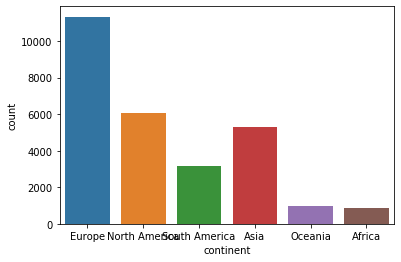

In [18]:
sns.countplot(x='continent', data=data)


In [20]:
continent_gb = data.groupby(['continent'])
country_gb =  data.groupby(['country'])
# countryYear.mean()
continent_gb['total_suicides'].sum()


# country_gb['suicides_no'].sum()

continent
Africa             11257
Asia             1451437
Europe           3397653
North America    1340639
Oceania            84851
South America     446980
Name: total_suicides, dtype: int64

In [46]:
import plotly.express as px
import numpy as np
gapminder = px.data.gapminder()
#gapminder.columns


fig = px.scatter_3d(data, x='year', y='continent', z='population', size='gdp_per_capita', color='gdp_per_capita',
                    hover_data=['country'])
fig.update_layout(scene_zaxis_type="log")
fig.show()

In [66]:
import plotly.graph_objects as go

total_suicides = data['total_suicides']
year = data['year']
continent = data['continent']

fig = go.Figure(data=go.Heatmap(
        z=total_suicides,
        x=year,
        y=continent,
        colorscale='Viridis'))

fig.update_layout(
    title='Countries suicides_per_100k with year',
    xaxis_nticks=20)

fig.show()

In [71]:
import plotly.express as px

px.scatter(data, x="gdp_per_capita", y="suicides_per_100k", animation_frame="year", animation_group="country",
           size="population", color="age", hover_name="country",template='seaborn',
           log_x=True)